In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

## Load file : TaO100-PRtg300

In [2]:
data_folder = 'TaO100-PRtg300-run 1 042623'
# Gray
Gray_file = f'{data_folder}/ResultGrayMi.csv'
df_gray = pd.read_csv(Gray_file)

#Red
Red_file = f'{data_folder}/ResultRedMi.csv'
df_red = pd.read_csv(Red_file)

#Green
Green_file = f'{data_folder}/ResultGreenMi.csv'
df_green = pd.read_csv(Green_file)

#Blue
Blue_file = f'{data_folder}/ResultBlueMi.csv'
df_blue = pd.read_csv(Blue_file)

### Create a new row with column names

In [3]:
def create_columns_name(df):
    # Create a new row with numerical column names
    column_names = ['time'] + [f'sensor_{i}' for i in range(1, len(df.columns))]
    df_processed = pd.DataFrame([column_names] + df.values.tolist())

    # Update the column names of the DataFrame
    df_processed.columns = df_processed.iloc[0]

    # Remove the first row (numerical column names)
    df_processed = df_processed.iloc[1:]

    return df_processed


# Process each DataFrame individually
df_gray = create_columns_name(df_gray)
df_red = create_columns_name(df_red)
df_green = create_columns_name(df_green)
df_blue = create_columns_name(df_blue)

In [4]:
df_blue

,time,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,...,sensor_54,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_60,sensor_61,sensor_62,sensor_63
1,1.454908,0.379878,0.634451,-0.269375,0.377744,-0.189423,0.238141,0.019375,-0.141582,0.01372,...,-0.039199,-0.168452,0.240708,-0.379167,-0.165116,-0.186047,0.138095,-0.028869,0.152083,0.008547
2,2.45879,0.107927,0.392988,-0.01625,0.292988,-0.088782,0.105449,0.154375,-0.157644,0.078963,...,0.138502,-0.065476,0.082172,-0.106548,-0.038372,-0.067442,0.229762,0.033036,0.169345,0.032357
3,3.523265,0.096341,0.346646,-0.301875,0.155793,-0.413141,-0.158013,-0.278125,-0.51041,-0.094207,...,-0.187282,-0.283333,-0.026423,-0.320833,-0.027907,-0.214535,-0.054762,-0.208631,-0.133036,0.054335
4,4.455261,0.096951,0.256402,0.126875,0.272866,0.024038,0.141346,0.151875,-0.251636,-0.182622,...,-0.020035,-0.064881,0.083333,-0.098214,0.261628,0.045349,-0.227976,0.038988,0.041369,0.047009
5,5.432514,0.057317,0.139329,-0.289375,-0.055183,-0.156731,0.025962,0.11875,-0.114813,-0.072256,...,0.062427,0.141071,0.032811,-0.110119,-0.03314,0.191279,-0.130952,-0.131845,0.028274,0.098901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2348,2128.941614,-0.652439,-0.300915,-0.90375,-0.748476,-0.666346,-0.198397,0.115,-0.537775,-0.369817,...,-0.792973,-0.79881,0.389373,0.440476,-0.433721,-1.030814,-0.869643,-0.15506,0.003274,0.130647
2349,2129.933488,-0.626829,-0.248476,-0.595,-0.634451,-0.995192,0.109295,-0.044375,-0.795955,-0.120427,...,-0.704123,-0.657143,0.539199,0.343452,-0.223837,-0.789535,-1.032738,0.045536,0.212798,0.081197
2350,2130.928732,-0.706098,-0.551524,-0.75,-0.645427,-0.873397,-0.083013,0.13,-0.869126,-0.183232,...,-0.533972,-0.608929,0.594948,0.570833,-0.510465,-0.921512,-0.788095,-0.041369,0.086607,-0.006716
2351,2131.899983,-0.625,-0.31128,-0.81125,-0.71311,-0.975321,-0.342628,0.04125,-0.644259,-0.2375,...,-0.63676,-0.707738,0.26626,0.582738,-0.413372,-0.900581,-0.858929,-0.28125,-0.121726,0.168498


#

# Compare Bands

### STD comparison 

In [5]:
# Compute standard deviation by columns (sensors) for each band
std_gray = np.std(df_gray.iloc[:, 1:], axis=0)
std_red = np.std(df_red.iloc[:, 1:], axis=0)
std_green = np.std(df_green.iloc[:, 1:], axis=0)
std_blue = np.std(df_blue.iloc[:, 1:], axis=0)

# Create a table of standard deviation values
sensors = df_gray.columns[1:]  # Exclude the first column (assuming it contains frame data)
result_table_STD = pd.DataFrame({'Sensor': sensors, 'Gray': std_gray, 'Red': std_red, 'Green': std_green,
                             'Blue': std_blue})


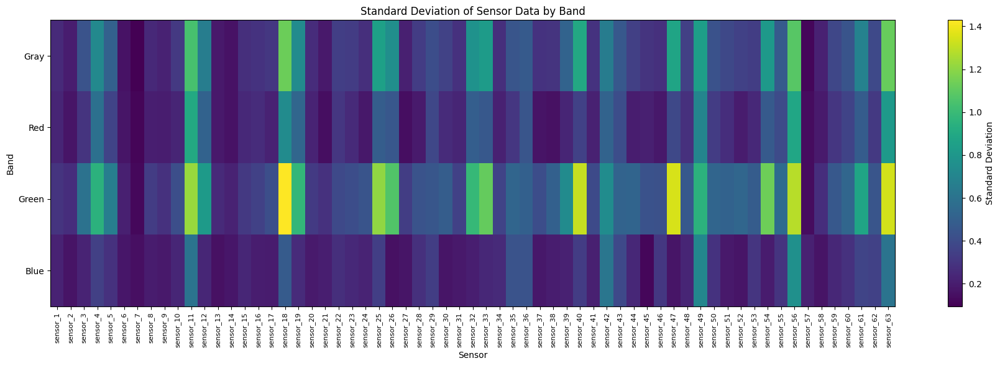

In [6]:
# Visualize the result as a heatmap
result_data = result_table_STD.set_index('Sensor').T
result_data = result_data.apply(pd.to_numeric)  # Convert values to numeric data types
fig, ax = plt.subplots(figsize=(18, 6))
heatmap = ax.imshow(result_data, cmap='viridis', aspect='auto')
plt.colorbar(heatmap, ax=ax, label='Standard Deviation')
ax.set_xticks(np.arange(len(sensors)))
ax.set_xticklabels(sensors, rotation=90, fontsize=8)
ax.set_yticks(np.arange(len(result_data.index)))
ax.set_yticklabels(result_data.index)
ax.set_xlabel('Sensor')
ax.set_ylabel('Band')
ax.set_title('Standard Deviation of Sensor Data by Band')
plt.tight_layout()
plt.show()

#### most responsive sensors

In [21]:
# Calculate the average std for each band
average_std = result_table_STD[['Gray', 'Red', 'Green', 'Blue']].mean(axis=1)

# Rank the sensors based on their average std values
ranked_sensors = average_std.sort_values(ascending=False)

# Get the top 10 most responsive sensors
top_10_sensors = ranked_sensors.index[:10]

# Print the result
print("\033[1;34mMost responsive sensor\033[0m:", top_10_sensors[0], "(Avg Std:", average_std[top_10_sensors[0]], ")")
print("\n\033[1;34mTop 10 most responsive sensors:\033[0m")
for i, sensor in enumerate(top_10_sensors[1:], start=2):
    suffix = "st" if i == 1 else "nd" if i == 2 else "rd" if i == 3 else "th"
    print(f"{i}{suffix}: {sensor} (Avg Std: {average_std[sensor]:.6f})")


Most responsive sensor: sensor_56 (Avg Std: 1.0037980748347026 )

Top 10 most responsive sensors:
2nd: sensor_63 (Avg Std: 0.969364)
3rd: sensor_11 (Avg Std: 0.943299)
4th: sensor_18 (Avg Std: 0.942616)
5th: sensor_49 (Avg Std: 0.802144)
6th: sensor_25 (Avg Std: 0.723071)
7th: sensor_40 (Avg Std: 0.722958)
8th: sensor_47 (Avg Std: 0.693112)
9th: sensor_33 (Avg Std: 0.661283)
10th: sensor_54 (Avg Std: 0.654259)


#### Most avg highest_sdt band 

In [23]:
# Calculate the average std for each band
average_std = result_table_STD[['Gray', 'Red', 'Green', 'Blue']].mean(axis=0)

# Rank the bands based on their average std values
ranked_bands = average_std.sort_values(ascending=False)

# Print the result in blue color
print("\033[94mMost Suitable Band for Further Analysis:\033[0m")
for i, band in enumerate(ranked_bands.index):
    avg_std = average_std[band]
    print(f"{i+1}st: {band} (Avg Std: {avg_std:.4f})")


Most Suitable Band for Further Analysis:
1st: Green (Avg Std: 0.5988)
2st: Gray (Avg Std: 0.4594)
3st: Red (Avg Std: 0.3326)
4st: Blue (Avg Std: 0.2772)


#

### SNR comparison 

In [24]:
# Compute standard deviation by columns (sensors) for each band
std_gray = np.std(df_gray.iloc[:, 1:], axis=0)
std_red = np.std(df_red.iloc[:, 1:], axis=0)
std_green = np.std(df_green.iloc[:, 1:], axis=0)
std_blue = np.std(df_blue.iloc[:, 1:], axis=0)

# Compute mean by columns (sensors) for each band
mean_gray = np.mean(df_gray.iloc[:, 1:], axis=0)
mean_red = np.mean(df_red.iloc[:, 1:], axis=0)
mean_green = np.mean(df_green.iloc[:, 1:], axis=0)
mean_blue = np.mean(df_blue.iloc[:, 1:], axis=0)

# Compute SNR for each band
snr_gray = mean_gray / std_gray
snr_red = mean_red / std_red
snr_green = mean_green / std_green
snr_blue = mean_blue / std_blue



# Create a table of SNR values
sensors = df_gray.columns[1:]  # Exclude the first column (assuming it contains frame data)
result_table_SNR = pd.DataFrame({'Sensor': sensors, 'Gray': snr_gray, 'Red': snr_red, 'Green': snr_green,
                             'Blue': snr_blue})


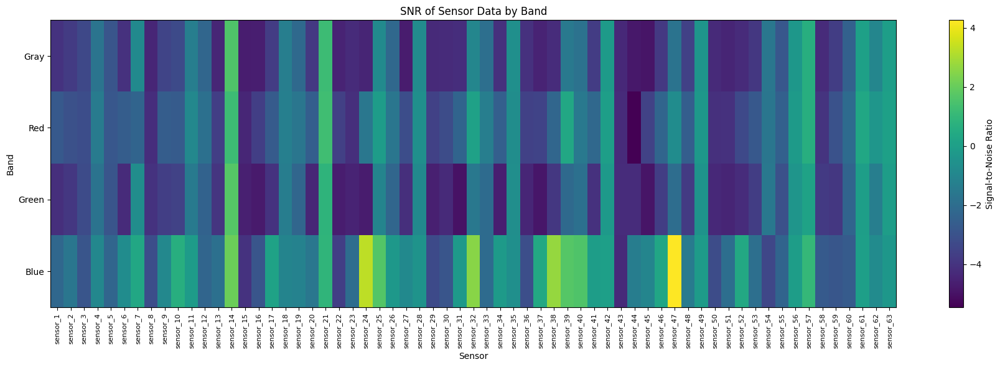

In [25]:
# Visualize the result as a heatmap
result_data = result_table_SNR.set_index('Sensor').T
result_data = result_data.apply(pd.to_numeric)  # Convert values to numeric data types
fig, ax = plt.subplots(figsize=(18, 6))
heatmap = ax.imshow(result_data, cmap='viridis', aspect='auto')
plt.colorbar(heatmap, ax=ax, label='Signal-to-Noise Ratio')
ax.set_xticks(np.arange(len(sensors)))
ax.set_xticklabels(sensors, rotation=90, fontsize=8)
ax.set_yticks(np.arange(len(result_data.index)))
ax.set_yticklabels(result_data.index)
ax.set_xlabel('Sensor')
ax.set_ylabel('Band')
ax.set_title('SNR of Sensor Data by Band')
plt.tight_layout()
plt.show()

#### Less noisy band 

In [37]:
# Calculate the average std for each band
average_SNR = result_table_SNR[['Gray', 'Red', 'Green', 'Blue']].mean(axis=0)

# Rank the bands based on their average std values
ranked_bands = average_SNR.sort_values()

# Print the result in blue color
print("\033[94mLess noisy:\033[0m")
for i, band in enumerate(ranked_bands.index):
    avg_std = average_std[band]
    print(f"{i+1}st: {band} (Avg SNR: {avg_std:.4f})")

Less noisy:
1st: Green (Avg SNR: 0.5988)
2st: Gray (Avg SNR: 0.4594)
3st: Red (Avg SNR: 0.3326)
4st: Blue (Avg SNR: 0.2772)


#

#

### Visualization bands

### Plot Green Band

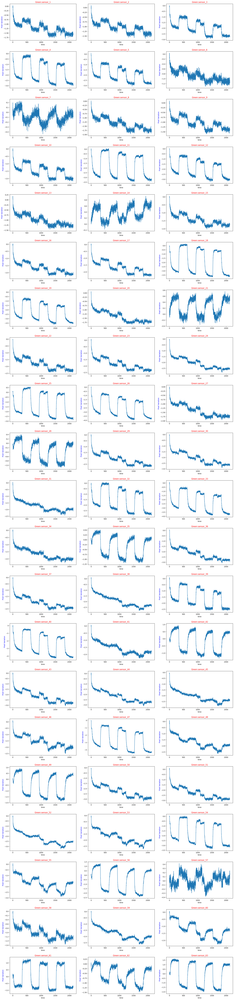

In [31]:
# Get the column names excluding the frame column
df = df_green
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    ax.set_title(f"Green:{sensor}", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#### Filtred Δ%R green data

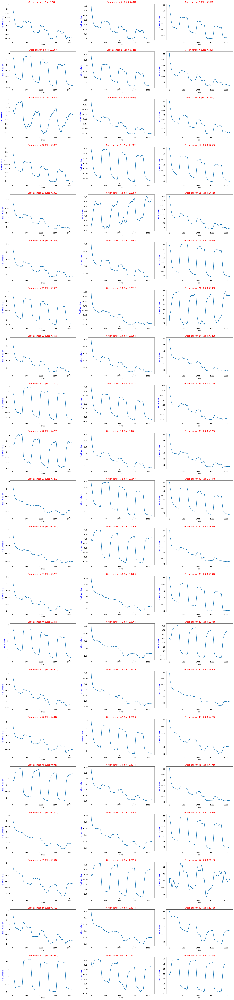

In [32]:
# Get the column names excluding the frame column
sensor_columns = df_green.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Apply moving average and plot the smoothed data
window_size = 50 # Adjust the window size as desired
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    filtered_data = df_green[sensor].rolling(window=window_size, min_periods=1).mean()
    ax.plot(df_green['time'], filtered_data) 
    std_value = np.std(df_green[sensor].rolling(window=window_size, min_periods=1).mean().iloc[window_size - 1:].values)
    ax.set_title(f"Green {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis


# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Gray band 

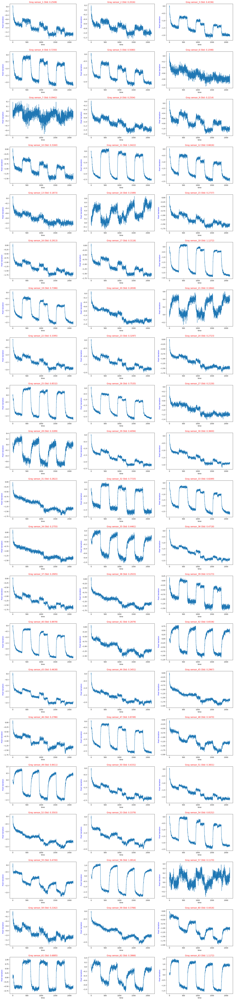

In [33]:
# Get the column names excluding the frame column
df = df_gray
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"Gray {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Red band

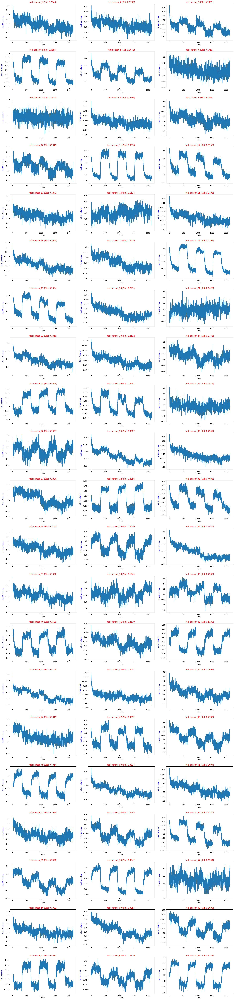

In [35]:
# Get the column names excluding the frame column
df = df_red
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"red: {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Blue Band 

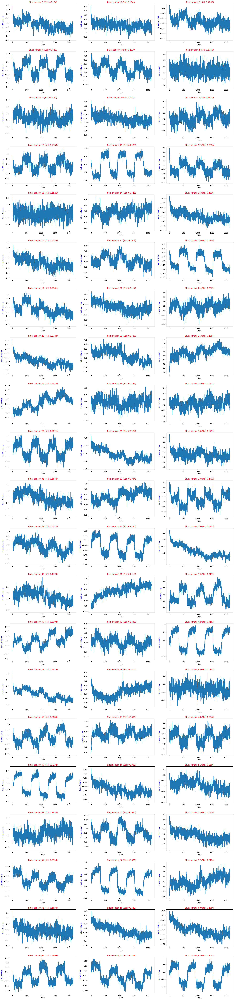

In [34]:
# Get the column names excluding the frame column
df = df_blue
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"Blue: {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### plot the 4 bands data for the 10 most responsive sensors


The 10 most responsive sensors



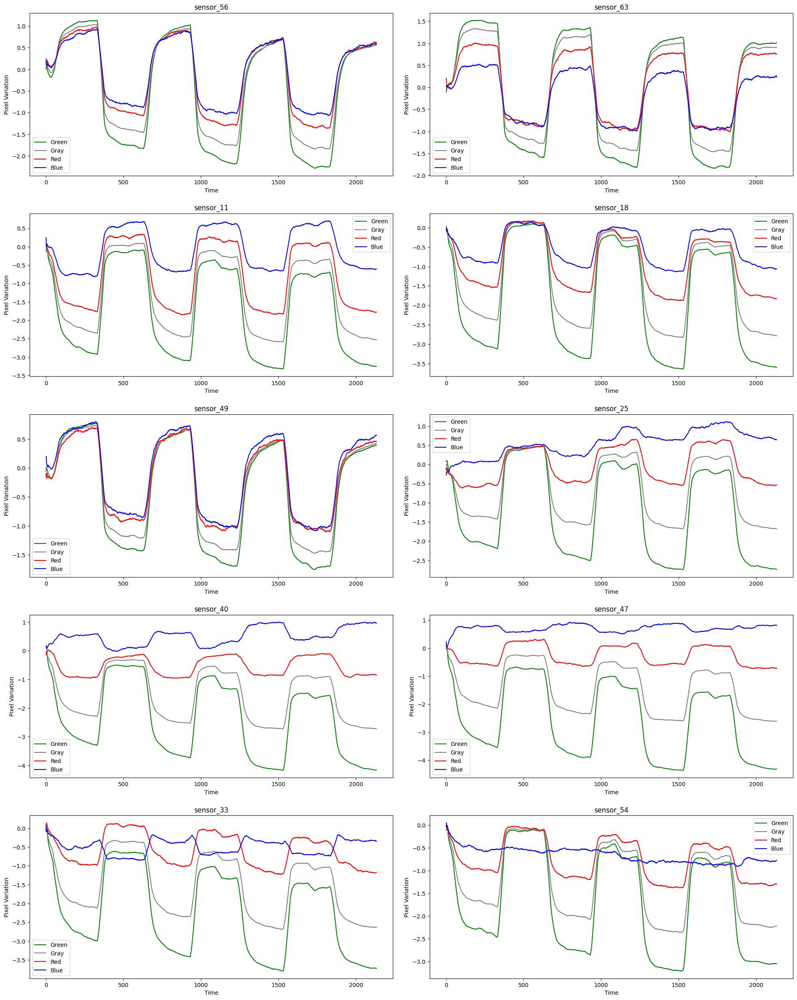

In [42]:
# Define the number of sensors to plot
num_sensors = 10  # Adjust the number of sensors as desired

# Get the top 10 most responsive sensors
top_sensors = ranked_sensors.index[:num_sensors]

# Set the layout of the subplots
subplot_rows = int((num_sensors + 1) / 2)  # Adjust the number of rows as needed
subplot_cols = 2  # Number of columns is fixed at 2 for two subplots per row

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 5 * subplot_rows))

# Flatten the axes array if necessary
axes = axes.flatten()


# Print the title with an increased font size
print('\n\033[1mThe 10 most responsive sensors\033[0m\n')

# Apply moving average and plot the smoothed data for each sensor and band
window_size = 50  # Adjust the window size as desired
for i, sensor in enumerate(top_sensors):
    ax = axes[i]
    filtered_green = df_green[sensor].rolling(window=window_size, min_periods=1).mean()
    filtered_gray = df_gray[sensor].rolling(window=window_size, min_periods=1).mean()
    filtered_red = df_red[sensor].rolling(window=window_size, min_periods=1).mean()
    filtered_blue = df_blue[sensor].rolling(window=window_size, min_periods=1).mean()

    ax.plot(df_green['time'], filtered_green, label='Green', color='green')
    ax.plot(df_gray['time'], filtered_gray, label='Gray', color='gray')
    ax.plot(df_red['time'], filtered_red, label='Red', color='red')
    ax.plot(df_blue['time'], filtered_blue, label='Blue', color='blue')
    ax.set_title(f"{sensor}")
    ax.set_xlabel('Time')
    ax.set_ylabel('Pixel Variation')
    ax.legend()

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)

# Show the plot
plt.show()

